## <center>Color image quantization and texture mapping onto a surface</center> 

The aim of this notebook is to illustrate how a color  image represented by an array of shape (r, c, d), with d=3 or 4, can be  displayed as a Plotly heatmap, and moreover as a texture onto a surface.

  Given a color  image of resolution (rows, cols, d), d=3 or 4, and a number of colors, `n_colors`= $2^k$, for some $k =3, 4, 5, 6, 7,  8$, we perform  image color quantization  to extract the basic elements that define a Plotly heatmap, namely, an array of shape (rows, cols), as  `z_data`, and a colorscale that contains only `n_colors`, not all image colors. Then triangulating a surface of equation z=f(x,y), $(x,y)\in[a,b]\times [c,d]$  or parameterized by $(u,v)\in[a,b]\times[c,d]\mapsto (X(u,v), Y(u,v), Z(u,v))$, we assign     an intensity value from `z_data` to each triangle and plot the corresponding `Mesh3d`. The rectangle $[a,b]\times [c,d]$ is uniformly and regularly triangulated, as illustrated below:


![reg tri](https://raw.githubusercontent.com/empet/Texture-mapping-with-Plotly/main/images/regular-tri.png)

 The `Mesh3d` representation of the surface is plotted  with `intensitymode="cell"`. `z_data` values  are in a one-to-one correspondence to the  image pixels, i.e. to the triangulation vertices. For r=rows, c =cols, we have $rc$ vertices and $2(r-1)(c-1)$ triangles. For $rc > 2(r+c-1)$ the number of triangles is bigger than  that of vertices.
This condition occurs for  images of resolution, with  $r, c >=4$.   Hence we must define a mapping to associate to each triangle (cell) a  `z_data`-value, as its intensity.
After a few experiments we decided to use the following rule: 

z_intensity($\triangle{ABC}$)=z_data(B), and 
z_intensity($\triangle{ACD}$)=z_data(D):

![cell intens](https://raw.githubusercontent.com/empet/Texture-mapping-with-Plotly/main/images/cell-intensity.png)

Here a triangle is not represented by its coordinates, but by its code, [i, j, k], given usually in meshing.
The above  triangulation and intensity value assignment to cells is represented with respect to the array indices.
The y-reversal, via np.flipud in the go.Mesh3d instantiation, for fig2, fig3 definition below, mirrors this representation through the uppermost horizontal line  of the triangulation illustrated above.

In [1]:
import numpy as np
from numpy import pi, sin, cos
import skimage.io as sio
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
from texture import *
from utils import *
pio.renderers.default = "notebook"

### Texture mapping onto a surface z=f(x,y)


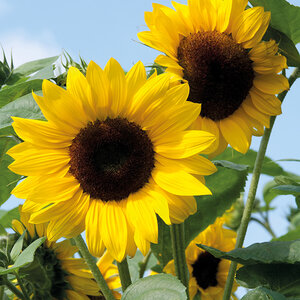

In [2]:
imgs = ["sun-flower.jpg" , "street-exhibition.jpg"]
img1 = sio.imread(f"images/{imgs[0]}") 
px.imshow(img1)

Let us represent this image as a heatmap:

In [ ]:
z_data, pl_colorscale = image2zvals(img1, n_colors=32, n_training_pixels=2000)
fig1 = go.Figure(go.Heatmap(z=np.flipud(z_data), colorscale=pl_colorscale))
fig1.update_layout(title_text="Image represented as a heatmap", title_x=0.5,
           width=600, height=600)
fig1.show()

This sufficiently accurate representation suggested to use the same method for colormapping `z_data` as a texture onto a surface.


In [3]:
r, c, _  = img1.shape
x, y, z = surface(r, c)

In [ ]:
fig2 = go.Figure(go.Surface(x=x[0, :], y = np.flipud(y[:, 0]), z=z, 
                            surfacecolor=z_data, colorscale=pl_colorscale))
fig2.update_layout(width=600, height=600, **scene_style,
                  scene_camera_eye=dict(x=-2, y=-2, z=1.5))
fig2.show()

This big difference between heatmap representation of an image and its mapping as a texture is due to different methods of color
interpolation implemented for the two traces. In the future it is possible that Plotly will  update color interpolation for surfaces, such that the above method to be as accurate as for heatmaps.
Meanwhile we can perform texture mapping, by meshing the surface, as it was summarized in this notebook introduction.

**Texture mapping via meshing**

In [4]:
I, J, K, tri_color_intensity, pl_colorscale = mesh_data(img1, n_colors=32, n_training_pixels=5000) 
fig3 = go.Figure(go.Mesh3d(x=x.flatten(), y=np.flipud(y).flatten(), z=z.flatten(), 
                            i=I, j=J, k=K, intensity=tri_color_intensity, intensitymode="cell", 
                            colorscale=pl_colorscale, showscale=False))
fig3.update_layout(width=500, height=500,
                  margin=dict(t=5, r=5, b=5, l=5), 
                  scene_camera_eye=dict(x=-2, y=-2, z=1.5),
                  **scene_style)
fig3.show()

The next example is mapping as texture a color quantized image containg more details:

In [ ]:
img2 = sio.imread(f"images/{imgs[1]}") 
px.imshow(img2)

In [ ]:
r, c, _ = img2.shape
x, y, z = surface(r, c)
I, J, K, tri_color_intensity, pl_colorscale = mesh_data(img2, n_colors=32, n_training_pixels=5000) 
fig4 = go.Figure(go.Mesh3d(x=x.flatten(), y=np.flipud(y).flatten(), z=z.flatten(), 
                           i=I, j=J, k=K, intensity=tri_color_intensity, intensitymode="cell", 
                           colorscale=pl_colorscale, showscale=False))
fig4.update_layout(width=500, height=500,
                  margin=dict(t=5, r=5, b=5, l=5), 
                  scene_camera_eye=dict(x=-2, y=-2, z=1.5),
                  **scene_style)
fig4.show()

### Texture mapping onto a parameterized surfaces

The procedure for   image mapping onto a parameterized surface is  similar to that for surfaces defined as  graph of functions. Namely, the (u,v)-parameter rectangle is triangulated (meshed), as above. The only difference is
in assigning `x.flatten()`, `y.flatten()`, `z.flatten() ` to x, y, z in `go.Mesh3d`, as  vertex coordinates or   np.flipud(ing)  one of them, before flattening. To decide the right coordinate to be reversed we must take into account how the parameter rectangle is mapped physically onto the surface.

**1. Mapping an equirectangular image onto a sphere**

Details on equirectangular images can be found here: [https://github.com/empet/Equirectangular-and-Gnomonic-Proj](https://github.com/empet/Equirectangular-and-Gnomonic-Proj)

The following equirectangular image of the Earth was created  by the Earth Observatory experiment of the U.S.
Government's NASA space agency, and retrieved from [Wikipedia](https://pt.wikipedia.org/wiki/Ficheiro:Equirectangular-projection.jpg).

In [ ]:
img3 = sio.imread("images/Equirectangular-projection.jpg")
px.imshow(img3)

In [ ]:
r, c, _ = img3.shape
x, y, z = sphere(r, c)
I, J, K, tri_color_intensity, pl_colorscale = mesh_data(img3, n_colors=32, n_training_pixels=10000) 
fig5 = go.Figure()
fig5.add_mesh3d(x=x.flatten(), y=y.flatten(), z=np.flipud(z).flatten(),  
                            i=I, j=J, k=K, intensity=tri_color_intensity, intensitymode="cell", 
                            colorscale=pl_colorscale, showscale=False);

fig5.update_layout(width=700, height=700,
                  margin=dict(t=10, r=10, b=10, l=10),
                  scene_camera_eye=dict(x=-1.75, y=-1.75, z=1),
                  **scene_style)
fig5.show()

Now we are mapping only a part of an equirectangular image onto the corresponding spherical region.

In [ ]:
img4 = sio.imread("images/equi-image.jpg")
px.imshow(img4)

Crop a region from this image to be mapped to sphere:

In [ ]:
cropped_img = img4[:, 150:450, :]
r, c, _ = cropped_img.shape

Invalidate the sphere region corresponding to the cropped_image:               

In [ ]:
rows, cols, _ = img4.shape
x, y, z = sphere(rows, cols)
x[:, 150:450] = None
y[:, 150:450] = None
z[:, 150:450] = None
fig6=go.Figure(go.Surface(x=x, y=y, z=z, 
                          colorscale=[[0, "rgb(230, 230, 230)"], 
                                      [1, "rgb(230, 230, 230)"]], 
                          showscale=False))
fig6.update_layout(width=700, height=700, 
                   scene_camera_eye=dict(x=-1.75, y=-1.75, z=1),
                   **scene_style);

Map the cropped image onto sphere:

In [ ]:
u, v = np.meshgrid(np.linspace(0, 2*pi, cols), np.linspace(-pi/2, pi/2, rows))
U = u[:, 150:450]
V = v[:, 150:450]

X = cos(U)*cos(V)
Y = sin(U)*cos(V)
Z = sin(V)

I, J, K, tri_color_intensity, pl_colorscale = mesh_data(cropped_img, n_colors=32, n_training_pixels=5000) 
fig6.add_mesh3d(x=X.flatten(), y=Y.flatten(), z=np.flipud(Z).flatten(),  
                            i=I, j=J, k=K, intensity=tri_color_intensity, intensitymode="cell", 
                            colorscale=pl_colorscale, showscale=False);
fig6.show()

**2. Cylinder texture**

In [ ]:
imag = sio.imread("images/boys-and-girls.png")  
img5 = imag[5:, 18:621, :]
px.imshow(img5)

In [ ]:
r, c, _ = img5.shape
x, y, z = cylinder(r, c) #defined in utils
I, J, K, tri_color_intensity, pl_colorscale = mesh_data(img5, n_colors=32, n_training_pixels=5000) 
fig7 = go.Figure()
fig7.add_mesh3d(x=x.flatten(), y=y.flatten(), z=np.flipud(z).flatten(),  
                            i=I, j=J, k=K, intensity=tri_color_intensity, intensitymode="cell", 
                            colorscale=pl_colorscale, showscale=False);

fig7.update_layout(width=600, height=600,
                  paper_bgcolor="rgba(15,15,15, 0.8)",
                  margin=dict(t=10, r=10, b=10, l=10),
                  scene_camera_eye=dict(x=-1.75, y=-1.75, z=1.25),
                  **scene_style)
fig7.show()

**3. Cone texture**

Now map  the same image, img5, onto a cone: 

In [ ]:
x, y, z = cone(r, c) #cone is the function that parameterizes the cone x^2+y^2=(1-z)^2
I, J, K, tri_color_intensity, pl_colorscale = mesh_data(img5, n_colors=32, n_training_pixels=5000) 
fig8 = go.Figure()
fig8.add_mesh3d(x=x.flatten(), y=y.flatten(), z=z.flatten(), #here z is not flipud(ed)!!! 
                            i=I, j=J, k=K, intensity=tri_color_intensity, intensitymode="cell", 
                            colorscale=pl_colorscale, showscale=False);

fig8.update_layout(width=600, height=600,
                  paper_bgcolor="rgba(15,15,15, 0.8)",
                  margin=dict(t=10, r=10, b=10, l=10),
                  scene_camera_eye=dict(x=-1.75, y=-1.75, z=1.25),
                  **scene_style)
fig8.show()